In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px

In [ ]:
df=pd.read_csv('india_2.csv')

In [ ]:
df.shape

(36582, 7)

In [ ]:
df.sample(5)

,dt,AverageTemperature,AverageTemperatureUncertainty,City,Country,Latitude,Longitude
31943,1844-12-01,20.408,2.176,Pune,India,18.48N,74.37E
28022,1953-09-01,27.012,0.341,Nagpur,India,21.70N,78.75E
8637,1862-07-01,NaN,NaN,Calcutta,India,23.31N,88.25E
28142,1963-09-01,26.612,0.419,Nagpur,India,21.70N,78.75E
667,1851-08-01,27.196,1.335,Ahmadabad,India,23.31N,72.52E


In [ ]:
df.describe()

,AverageTemperature,AverageTemperatureUncertainty
count,34627.000000,34627.000000
mean,25.809309,0.946047
std,4.851196,0.822501
min,11.378000,0.056000
25%,22.935000,0.360000
50%,26.518000,0.575000
75%,29.254000,1.458000
max,36.477000,7.781000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36582 entries, 0 to 36581
Data columns (total 7 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   dt                             36582 non-null  object 
 1   AverageTemperature             34627 non-null  float64
 2   AverageTemperatureUncertainty  34627 non-null  float64
 3   City                           36582 non-null  object 
 4   Country                        36582 non-null  object 
 5   Latitude                       36582 non-null  object 
 6   Longitude                      36582 non-null  object 
dtypes: float64(2), object(5)
memory usage: 2.0+ MB


In [ ]:
df.dtypes

dt                                object
AverageTemperature               float64
AverageTemperatureUncertainty    float64
City                              object
Country                           object
Latitude                          object
Longitude                         object
dtype: object

In [ ]:
df['dt'] = df['dt'].str.strip()
df.index = pd.to_datetime(df.dt, format='%Y-%m-%d')
df = df.drop(columns=['dt'])

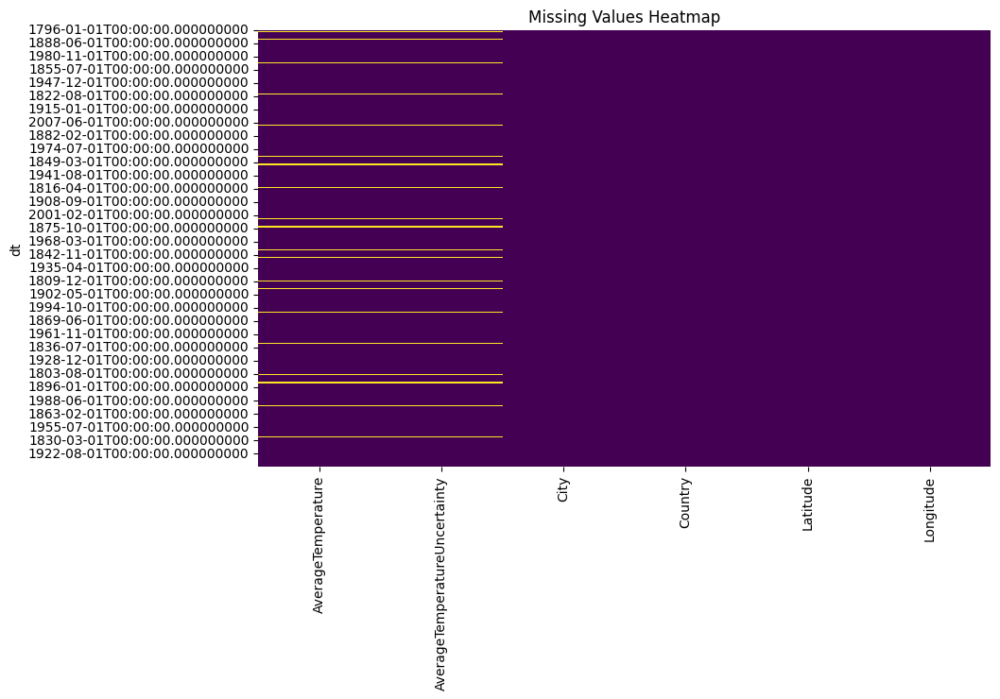

In [ ]:
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cmap='viridis', cbar=False)
plt.title('Missing Values Heatmap')
plt.show()

In [ ]:
number_missing_values = df['AverageTemperature'].isnull().sum()
print(f"Number of missing values in 'AverageTemperature': {number_missing_values}")

Number of missing values in 'AverageTemperature': 1955


In [ ]:
df.sample(5)

,AverageTemperature,AverageTemperatureUncertainty,City,Country,Latitude,Longitude
dt,,,,,,
1818-06-01,32.309,3.873,Kanpur,India,26.52N,80.60E
1853-08-01,27.401,1.205,Ahmadabad,India,23.31N,72.52E
1881-07-01,31.344,1.231,Madras,India,13.66N,80.09E
2009-06-01,35.543,0.527,New Delhi,India,28.13N,77.27E
1879-07-01,28.619,0.910,Calcutta,India,23.31N,88.25E


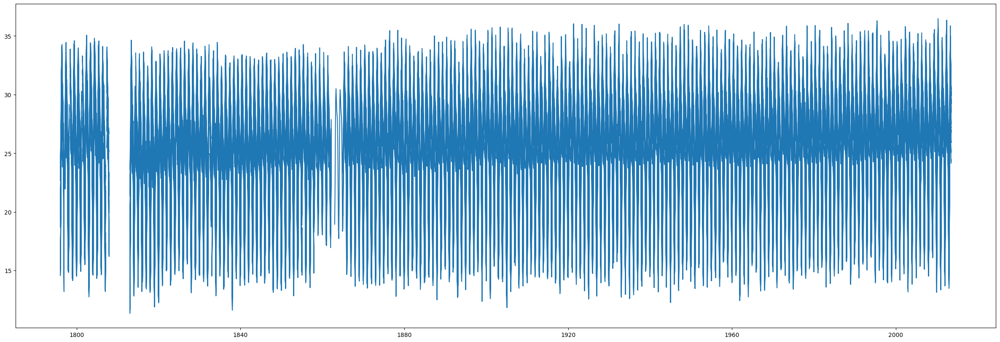

In [ ]:
plt.figure(figsize=(30,10))
plt.plot(df['AverageTemperature'])
plt.show()

In [ ]:
fig = px.histogram(df, x='AverageTemperature', nbins=30, title='Histogram of Average Temperature')
fig.show()

In [ ]:
data=df
data['Uncertainty_top'] = data['AverageTemperature'] + data['AverageTemperatureUncertainty']
data['Uncertainty_bottom'] = data['AverageTemperature'] - data['AverageTemperatureUncertainty']
data['years'] = data.index.year
fig = px.line(data, x='years', y=['Uncertainty_top', 'Uncertainty_bottom','AverageTemperature'], title='Average temperature in India')
fig.update_layout(width=1500, height=600)
fig.show()

In [ ]:
df = df[['AverageTemperature']].copy()

In [ ]:
df.head()

,AverageTemperature
dt,
1796-01-01,19.649
1796-02-01,21.632
1796-03-01,24.953
1796-04-01,30.297
1796-05-01,33.223


In [ ]:
df.reset_index(inplace=True)
df_imputed = df.copy()
df_imputed.dropna(inplace=True)
df_imputed['dt'] = df['dt']
df_imputed.set_index('dt', inplace=True)

In [ ]:
df_imputed.sample(5)

,AverageTemperature
dt,
1934-06-01,29.637
1804-03-01,22.327
1957-04-01,28.412
1824-11-01,27.342
1820-07-01,27.727


In [ ]:
df_imputed.isnull().sum()

AverageTemperature    0
dtype: int64

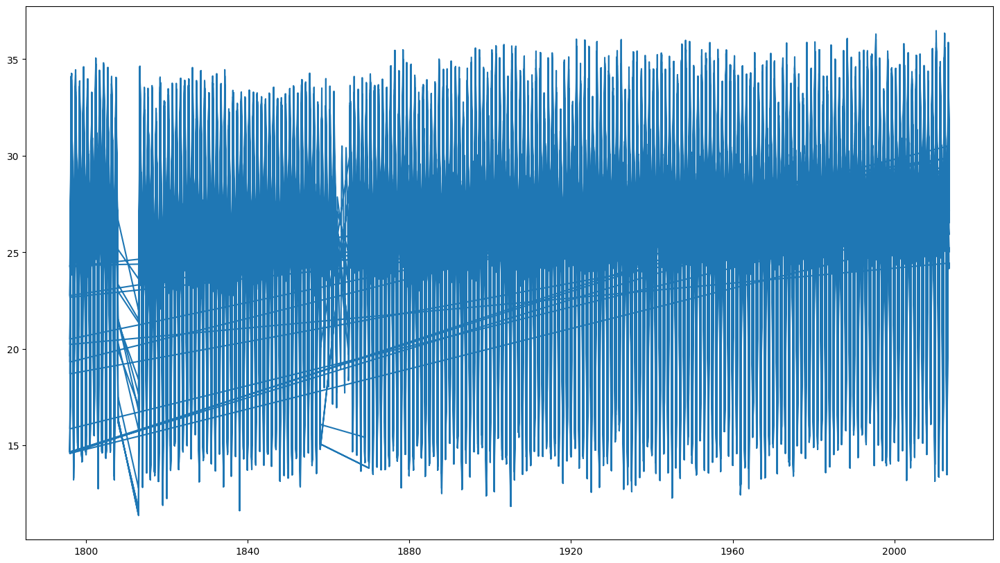

In [ ]:
plt.figure(figsize=(18,10))
plt.plot(df_imputed['AverageTemperature'])
plt.show()

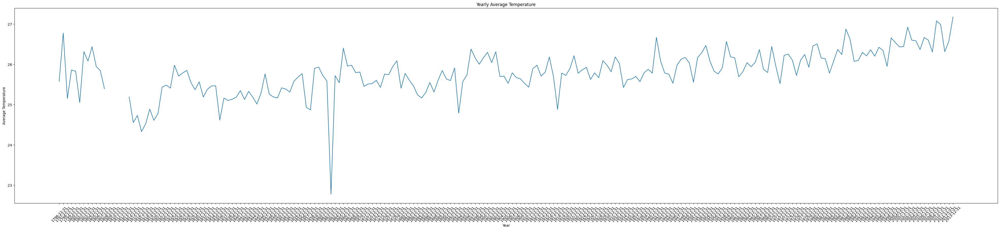

In [ ]:
df_imputed['Year'] = df_imputed.index.year
yearly_data = df_imputed['AverageTemperature'].resample('Y').mean()
yearly_data.index = yearly_data.index.strftime('%Y-%m-%d')
plot_data = pd.DataFrame({'AverageTemperature': yearly_data.values}, index=yearly_data.index)

plt.figure(figsize=(50, 10))
plt.plot(plot_data.index, plot_data['AverageTemperature'])
plt.xlabel('Year')
plt.ylabel('Average Temperature')
plt.title('Yearly Average Temperature')
plt.xticks(rotation=45)
plt.show()

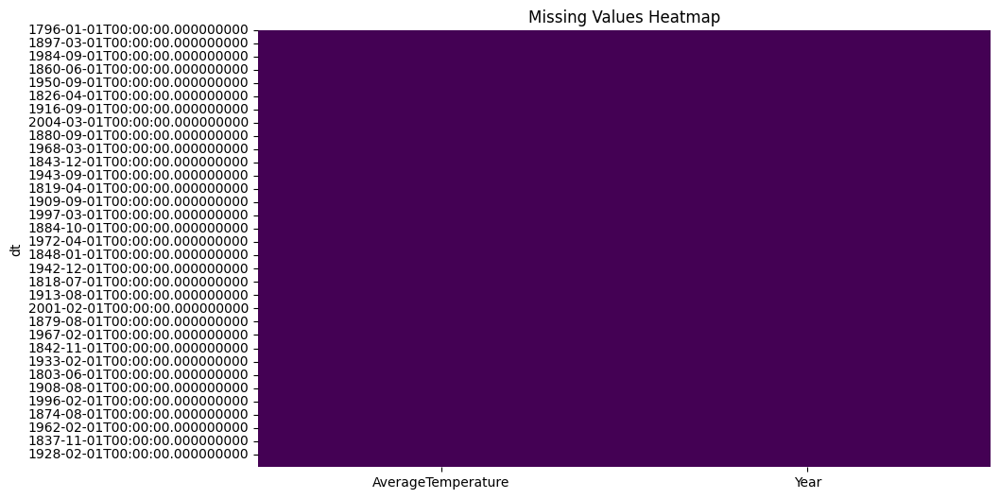

In [ ]:
plt.figure(figsize=(10, 6))
sns.heatmap(df_imputed.isnull(), cmap='viridis', cbar=False)
plt.title('Missing Values Heatmap')
plt.show()

In [ ]:
df_imputed.sample()

,AverageTemperature,Year
dt,,
1838-10-01,26.402,1838


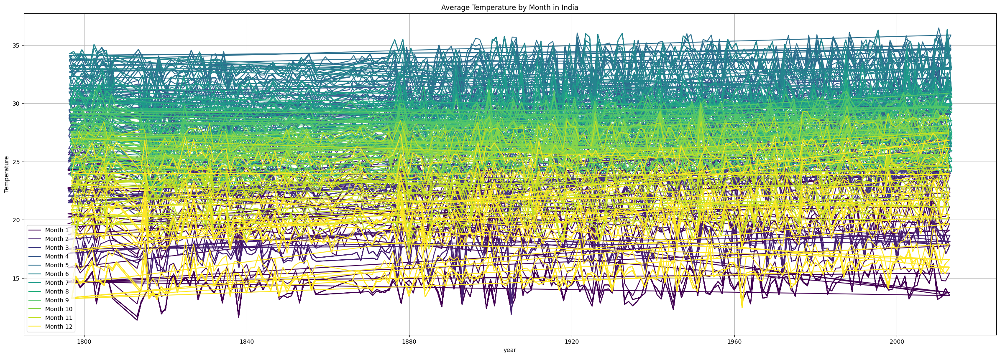

In [ ]:

months = df_imputed.index.month.unique()
plt.figure(figsize=(30, 10))
colors = plt.cm.viridis(np.linspace(0, 1, len(months)))

for month, color in zip(months, colors):
    plt.plot(df_imputed[df_imputed.index.month == month].index,
             df_imputed[df_imputed.index.month == month]['AverageTemperature'],
             label=f'Month {month}', color=color)

plt.title('Average Temperature by Month in India')
plt.xlabel('year')
plt.ylabel('Temperature')
plt.legend()
plt.grid(True)
plt.show()


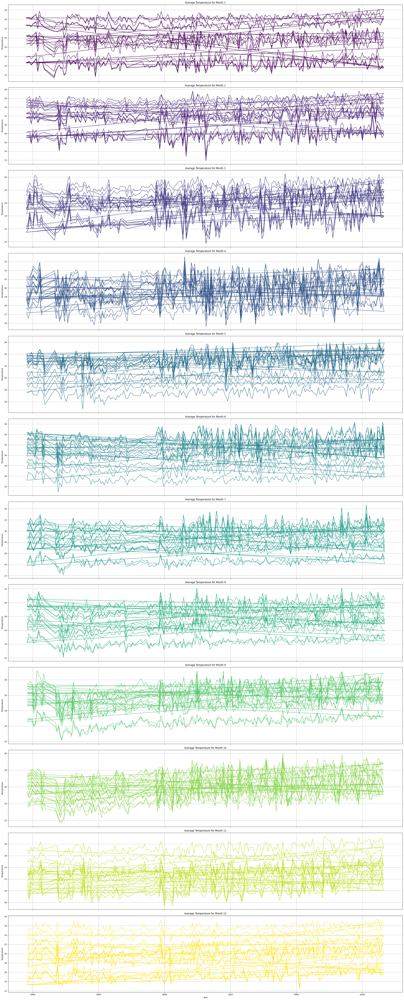

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
months = df_imputed.index.month.unique()
fig, axs = plt.subplots(len(months), 1, figsize=(28, 69), sharex=True)
colors = plt.cm.viridis(np.linspace(0, 1, len(months)))

for i, month in enumerate(months):

    monthly_data = df_imputed[df_imputed.index.month == month]


    axs[i].plot(monthly_data.index, monthly_data['AverageTemperature'], label=f'Month {month}', color=colors[i])
    axs[i].set_title(f'Average Temperature for Month {month}')
    axs[i].set_ylabel('Temperature')
    axs[i].grid(True)

plt.xlabel('Year')
plt.tight_layout()
plt.show()

In [ ]:
df_imputed['Year'] = df_imputed.index.year
df_imputed['Month'] = df_imputed.index.month
df_imputed.sample(10)

,AverageTemperature,Year,Month
dt,,,
2008-02-01,25.365,2008,2
1830-11-01,28.259,1830,11
1894-02-01,17.433,1894,2
1892-12-01,14.574,1892,12
1967-10-01,24.857,1967,10
1970-05-01,27.499,1970,5
1838-12-01,14.814,1838,12
1985-05-01,34.614,1985,5
1936-04-01,28.314,1936,4


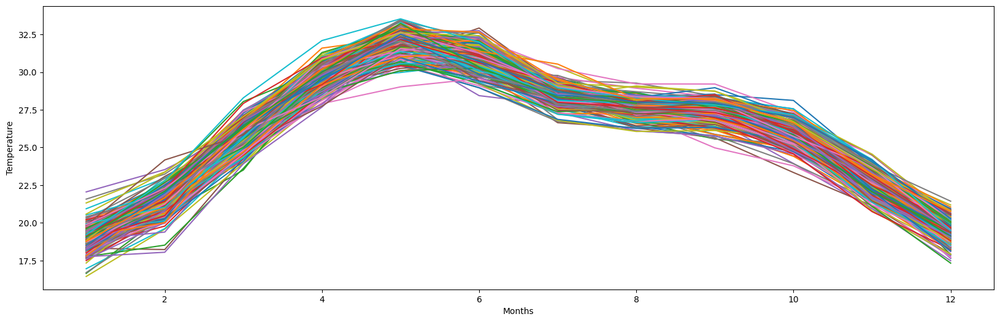

In [ ]:
df_imputed = df_imputed.copy()
df_imputed['Year'] = df_imputed.index.year
df_imputed['Month'] = df_imputed.index.month

pivot = df_imputed.pivot_table(index='Month', columns='Year', values='AverageTemperature', aggfunc='mean')

pivot.plot(figsize=(20, 6))
plt.legend().remove()
plt.xlabel('Months')
plt.ylabel('Temperature')
plt.show()

In [ ]:
df_imputed.sample()
df_imputed.dtypes

AverageTemperature    float64
Year                    int32
Month                   int32
dtype: object

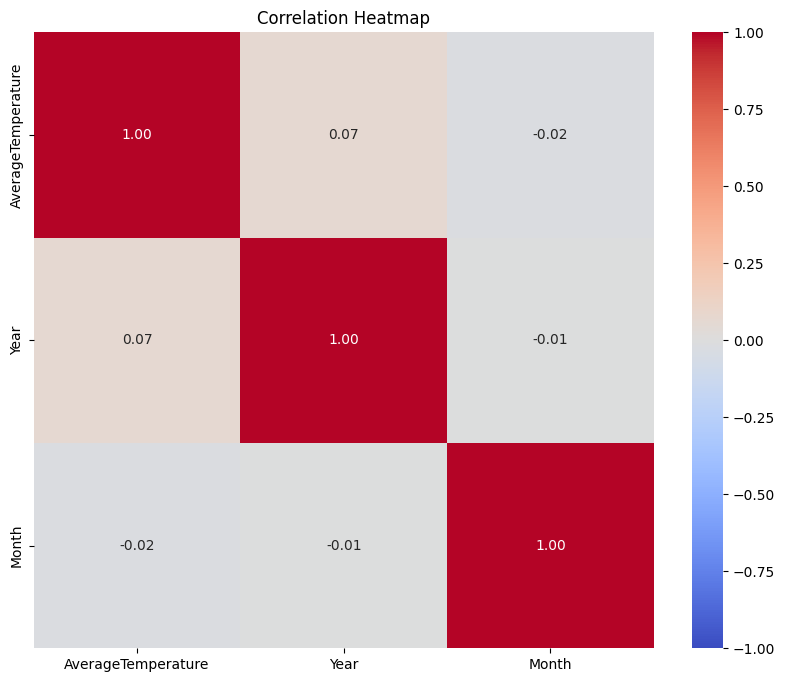

In [ ]:
correlation_matrix = df_imputed.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
df_imputed.sample()

,AverageTemperature,Year,Month
dt,,,
1905-04-01,27.299,1905,4


In [ ]:
# import numpy as np
# import pandas as pd
# import tensorflow as tf
# from sklearn.model_selection import train_test_split
# from sklearn.preprocessing import MinMaxScaler
# import matplotlib.pyplot as plt


# scaler = MinMaxScaler()
# df_imputed[['AverageTemperature', 'Year', 'Month']] = scaler.fit_transform(df_imputed[['AverageTemperature', 'Year', 'Month']])

# # Split the df_imputed into features and target
# X = df_imputed[['Year', 'Month']].values  # Using Year and Month as features
# y = df_imputed['AverageTemperature'].values

# # Split the df_imputed into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Reshape the features for RNN input (samples, time steps, features)
# X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
# X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))

# # Build the RNN model
# model = tf.keras.Sequential([
#     tf.keras.layers.SimpleRNN(50, input_shape=(X_train.shape[1], X_train.shape[2])),
#     tf.keras.layers.Dense(1)
# ])

# # Compile the model
# model.compile(optimizer='adam', loss='mse')

# # Train the model
# history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test), verbose=1)

# # Make predictions
# y_pred = model.predict(X_test)

In [ ]:
# plt.figure(figsize=(30, 6))
# plt.plot(y_test, label='Actual')
# plt.plot(y_pred, label='Predicted')
# plt.xlabel('Time')
# plt.ylabel('Temperature')
# plt.title('Temperature Prediction')
# plt.legend()
# plt.show()


In [ ]:
# from sklearn.metrics import mean_absolute_error, mean_squared_error

# mae = mean_absolute_error(y_test, y_pred)
# mse = mean_squared_error(y_test, y_pred)

# # Print evaluation results
# print(f'Mean Absolute Error (MAE): {mae}')
# print(f'Mean Squared Error (MSE): {mse}')

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

dataset = df_imputed.values


X = dataset[:, 1:]
y = dataset[:, 0]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
y_train_scaled = scaler.fit_transform(y_train.reshape(-1, 1)).reshape(-1)
y_test_scaled = scaler.transform(y_test.reshape(-1, 1)).reshape(-1)

X_train_scaled = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_scaled = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(1, X_train_scaled.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

history = model.fit(X_train_scaled, y_train_scaled, epochs=50, batch_size=32, validation_data=(X_test_scaled, y_test_scaled), verbose=2)
y_pred_scaled = model.predict(X_test_scaled)

Mean Squared Error (MSE): 6.315542463921024
Mean Absolute Error (MAE): 1.9810709565614575


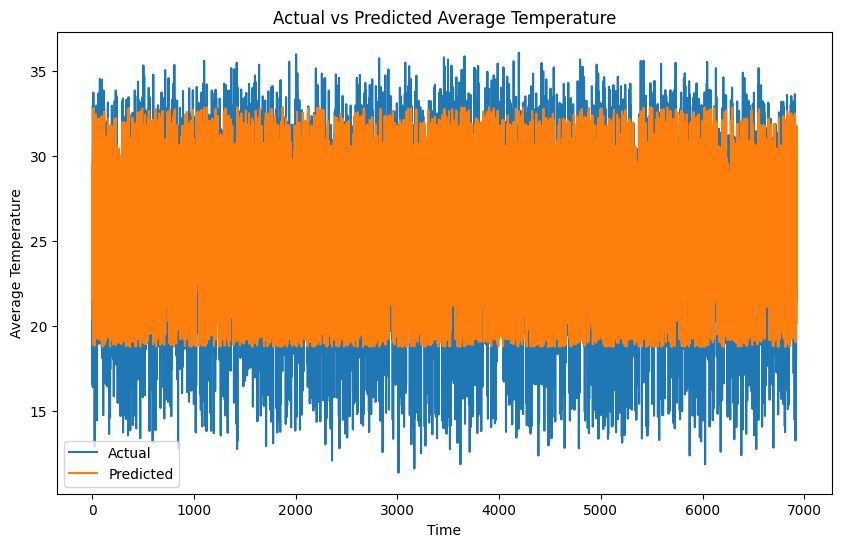

In [ ]:
y_pred = scaler.inverse_transform(y_pred_scaled.reshape(-1, 1)).reshape(-1)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)

plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.xlabel('Time')
plt.ylabel('Average Temperature')
plt.title('Actual vs Predicted Average Temperature')
plt.legend()
plt.show()